In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import seaborn as sns
import warnings

warnings.filterwarnings('ignore')
sns.set()

%config InlineBackend.figure_format = 'svg'

In [2]:
DATA_URL = "https://raw.githubusercontent.com/Yorko/mlcourse.ai/main/data/telecom_churn.csv"

In [3]:
df = pd.read_csv(DATA_URL)
df.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


# DataFrame.hist

### Plots histogram for numerical features in the data frame.

array([[<Axes: title={'center': 'Total day minutes'}>,
        <Axes: title={'center': 'Total intl calls'}>]], dtype=object)

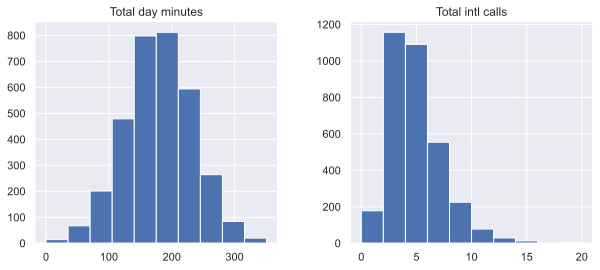

In [7]:
df[['Total day minutes','Total intl calls']].hist(figsize=(10,4))

# DataFrame.plot

### Plots based on kind parameter

array([[<Axes: ylabel='Density'>, <Axes: ylabel='Density'>]], dtype=object)

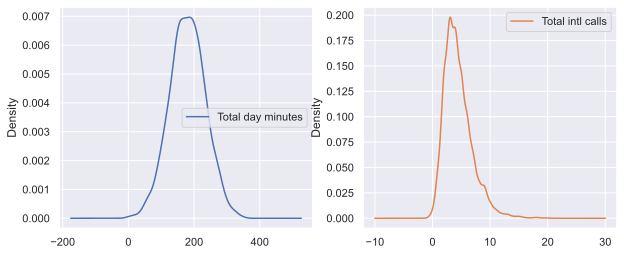

In [14]:
df[['Total day minutes','Total intl calls']].plot(kind='density',subplots=True,layout=(1,2),sharex=False,figsize=(10,4))

# sns.displot

### Plots histogram

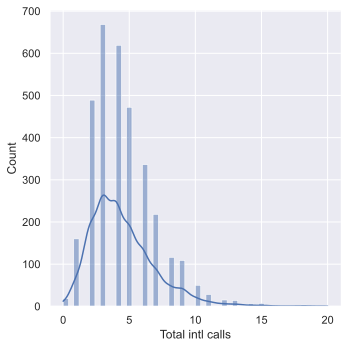

In [17]:
sns.displot(df['Total intl calls'],kde=True)

# sns.boxplot

### Plots a boxplot :)

C:\Python311\Lib\site-packages\seaborn\categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


<Axes: xlabel='Total intl calls'>

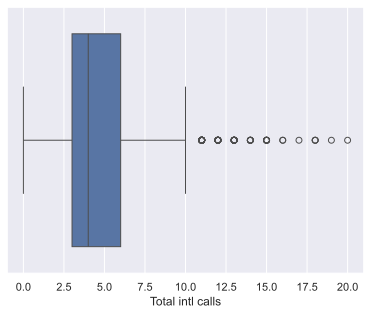

In [18]:
sns.boxplot(x='Total intl calls',data=df)

C:\Python311\Lib\site-packages\seaborn\categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
C:\Python311\Lib\site-packages\seaborn\_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


<Axes: xlabel='Total intl calls'>

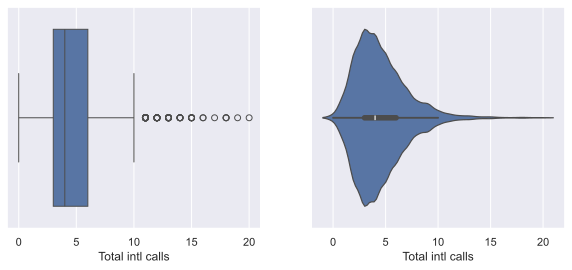

In [24]:
_,axes = plt.subplots(1,2,sharey=True,figsize=(10,4))
sns.boxplot(x='Total intl calls',data=df,ax=axes[0])
sns.violinplot(x='Total intl calls',data=df,ax=axes[1])

In [25]:
df[['Total day minutes','Total intl calls']].describe()

,Total day minutes,Total intl calls
count,3333.000000,3333.000000
mean,179.775098,4.479448
std,54.467389,2.461214
min,0.000000,0.000000
25%,143.700000,3.000000
50%,179.400000,4.000000
75%,216.400000,6.000000
max,350.800000,20.000000


In [26]:
df['Churn'].value_counts()

Churn
False    2850
True      483
Name: count, dtype: int64

# sns.countplot

### Plots the count of categorical features on y axis

<Axes: xlabel='Customer service calls', ylabel='count'>

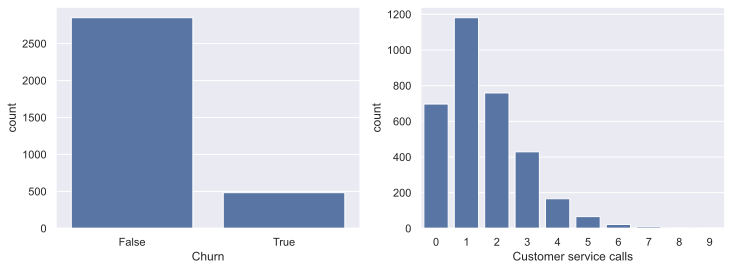

In [30]:
_,axes = plt.subplots(1,2,figsize=(12,4))
sns.countplot(x='Churn',data=df,ax=axes[0])
sns.countplot(x='Customer service calls',data=df,ax=axes[1])

# sns.heatmap

### Plots the heatmap :)

<Axes: >

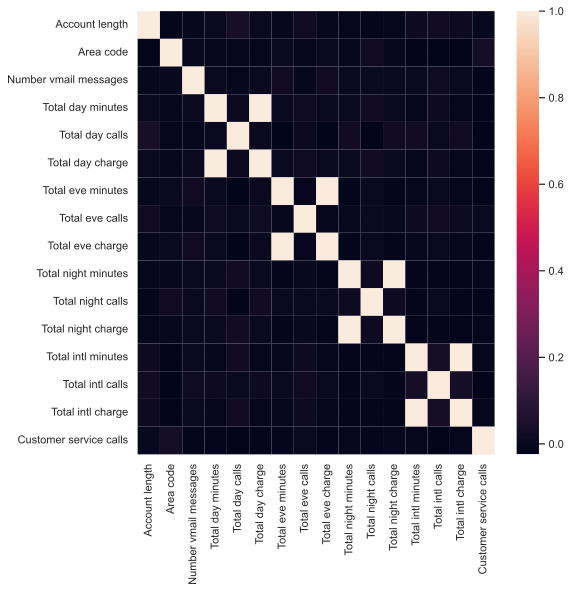

In [40]:
numerical = df.select_dtypes(include=np.number)
plt.figure(figsize=(8,8))
sns.heatmap(numerical.corr())

# plt.scatter

### Plots the relation between two variables

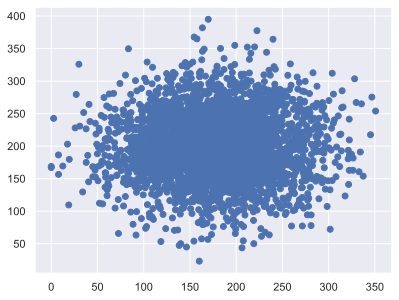

In [41]:
plt.scatter(df['Total day minutes'],df['Total night minutes'])

# sns.jointplot

### Plots the relation between variables with additional plot, hist by default

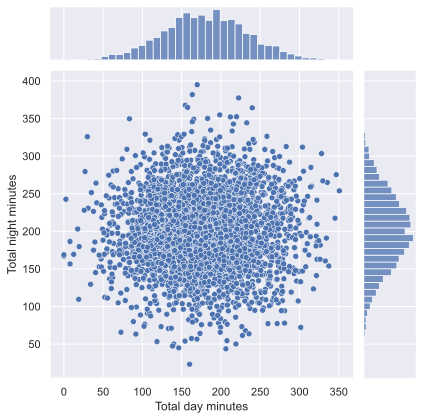

In [42]:
sns.jointplot(x='Total day minutes',y='Total night minutes',data=df,kind='scatter')

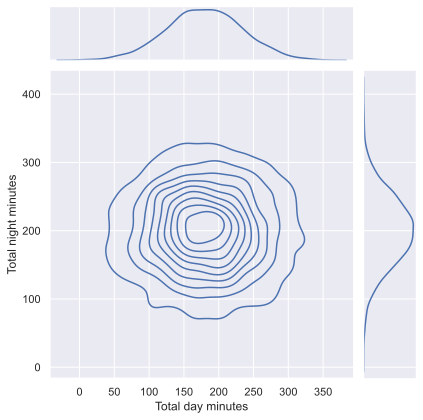

In [43]:
sns.jointplot(x='Total day minutes',y='Total night minutes',data=df,kind='kde')

# sns.pairplot

### Plots the relation between all numerical varialbes in the dataset

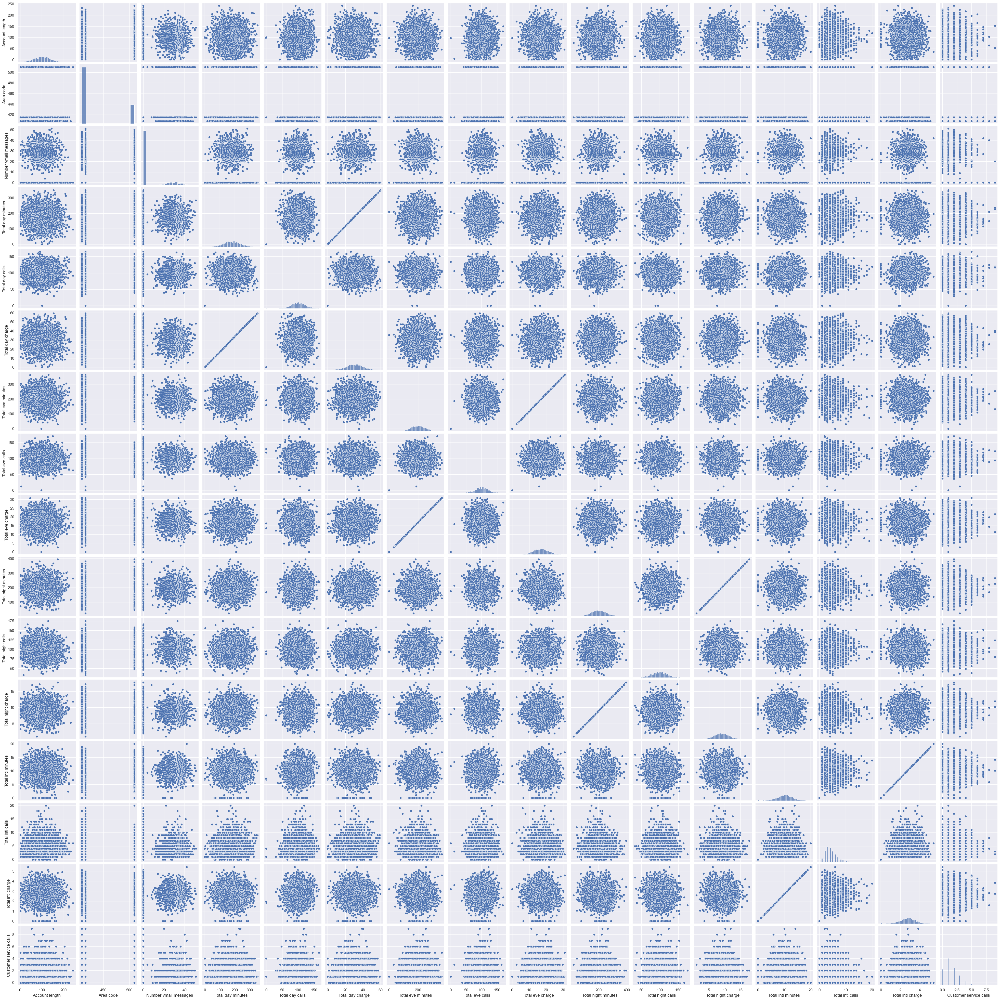

In [49]:
%config InlineBackend.figure_format = 'png'
sns.pairplot(numerical)

In [50]:
%config InlineBackend.figure_format = 'svg'

# sns.lmplot

### Plots variables and fits regression

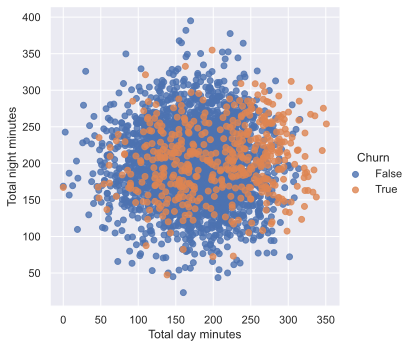

In [55]:
sns.lmplot(x="Total day minutes", y="Total night minutes", data=df, hue="Churn", fit_reg=False)

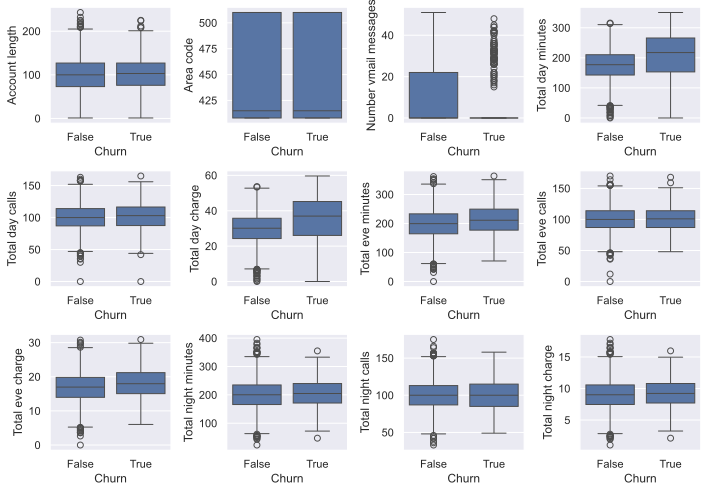

In [76]:
numerical_cols = numerical.columns
fig,axes = plt.subplots(nrows=3, ncols=4,figsize=(10,7))
idx = 0

for i in range(3):
    for j in range(4):
        sns.boxplot(x='Churn',y=numerical_cols[idx],data=df,ax=axes[i,j])
        idx+=1
fig.tight_layout()

<Axes: xlabel='Churn', ylabel='Total day minutes'>

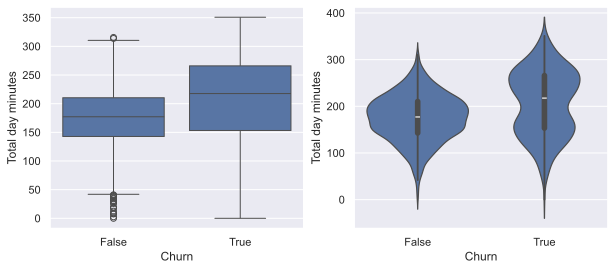

In [77]:
_,axes = plt.subplots(1,2,figsize=(10,4))

sns.boxplot(x='Churn',y='Total day minutes',data=df,ax=axes[0])
sns.violinplot(x='Churn',y='Total day minutes',data=df,ax=axes[1])

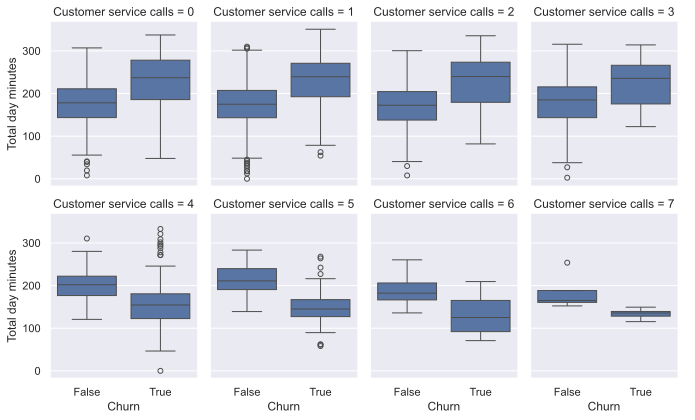

In [78]:
sns.catplot(x='Churn',y='Total day minutes',col="Customer service calls",
    data=df[df["Customer service calls"] < 8],
    kind="box",
    col_wrap=4,
    height=3,
    aspect=0.8,
)

<Axes: xlabel='Customer service calls', ylabel='count'>

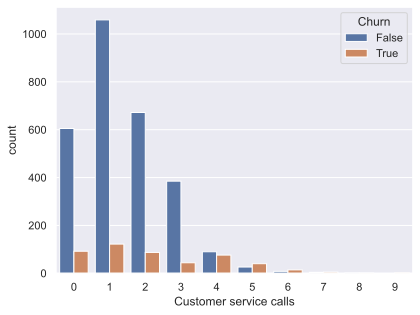

In [79]:
sns.countplot(x='Customer service calls',hue='Churn',data=df)

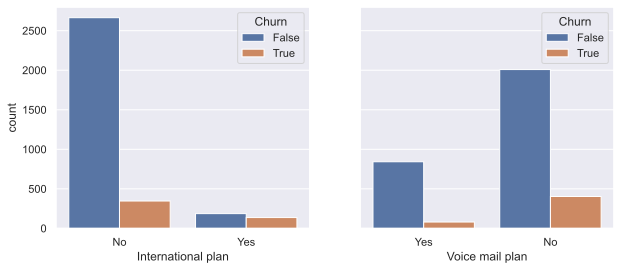

In [80]:
_, axes = plt.subplots(1, 2, sharey=True, figsize=(10, 4))

sns.countplot(x="International plan", hue="Churn", data=df, ax=axes[0])
sns.countplot(x="Voice mail plan", hue="Churn", data=df, ax=axes[1]);

In [81]:
pd.crosstab(df['State'],df['Churn'])

Churn,False,True
State,,
AK,49,3
AL,72,8
AR,44,11
AZ,60,4
CA,25,9
CO,57,9
CT,62,12
DC,49,5
DE,52,9


In [86]:
df.groupby(['State'])['Churn'].agg([np.mean]).sort_values(by="mean", ascending=False)

,mean
State,
NJ,0.264706
CA,0.264706
TX,0.250000
MD,0.242857
SC,0.233333
MI,0.219178
MS,0.215385
NV,0.212121
WA,0.212121


In [88]:
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

In [89]:
X = df.drop(['Churn','State'],axis=1)

X["International plan"] = X["International plan"].map({"Yes": 1, "No": 0})
X["Voice mail plan"] = X["Voice mail plan"].map({"Yes": 1, "No": 0})

In [90]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [91]:
%%time
tsne = TSNE(random_state=17)
tsne_repr = tsne.fit_transform(X_scaled)

CPU times: total: 45.9 s
Wall time: 12.4 s


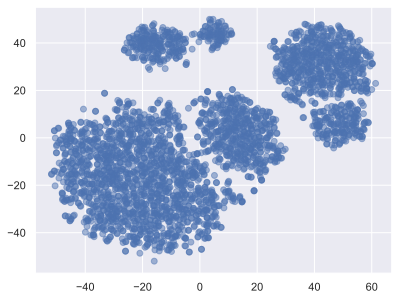

In [92]:
plt.scatter(tsne_repr[:, 0], tsne_repr[:, 1], alpha=0.5)

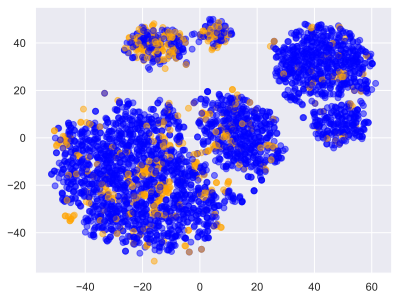

In [93]:
plt.scatter(
    tsne_repr[:, 0],
    tsne_repr[:, 1],
    c=df["Churn"].map({False: "blue", True: "orange"}),
    alpha=0.5,
);

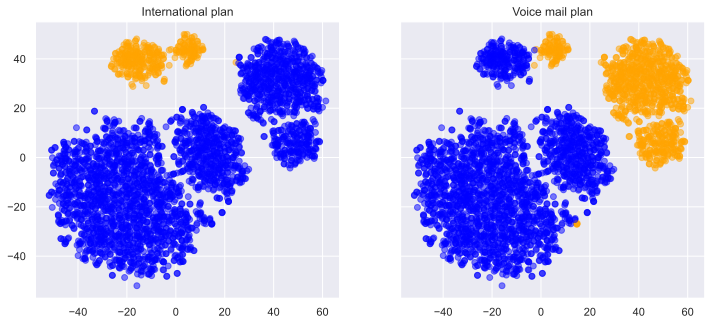

In [94]:
_, axes = plt.subplots(1, 2, sharey=True, figsize=(12, 5))

for i, name in enumerate(["International plan", "Voice mail plan"]):
    axes[i].scatter(
        tsne_repr[:, 0],
        tsne_repr[:, 1],
        c=df[name].map({"Yes": "orange", "No": "blue"}),
        alpha=0.5,
    )
    axes[i].set_title(name);